# **GIỚI THIỆU THÀNH VIÊN**

- Đỗ Thu Đông 20043131
- Nguyễn Trường Chinh 20045391
- Lê Thị Minh Thư 20052491
- Châu Mỹ Uyên 20087481
-  Trương Hữu Lợi 20047761

# **THÔNG TIN VỀ BỘ DỮ LIỆU**

Nguồn dữ liệu : https://data.world/sheilnaik/nj-teacher-salaries-2016

Sự mô tả : Dữ liệu về tiền lương, công việc và kinh nghiệm của giáo viên và nhân viên tại các trường học ở New Jersey. Số liệu tính đến ngày 15/10/2016.

Nguồn : Dữ liệu được lấy từ Asbury Park Press, lấy nguồn từ Bộ Giáo dục NJ.

Thông tin về các cột dữ liệu
- last_name	Last name of employee
- first_name	First name of employee
- county	Employee's school's county
- district	Employee's school's district
- school	Name of employee's school
- primary_job	Description of employee's primary job
- salary	Annual salary
- certificate	Description of teaching certificate earned by employee
- subcategory	Subcategory describing type of teacher/employee
- teaching_route	Indicates if the employee took the traditional teacher's route (education at an accredited college) or an alternate route. More information about alternate teaching routes available here.
- highly_qualified	Information about the teacher's qualification
- experience_total	Employee's number of years of experience in their career

# **CHI TIẾT BÀI LÀM**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Đọc dữ liệu
df = pd.read_csv('/content/drive/MyDrive/TAILIEU(nam3ki1)/LTPTDL/LAB/THỰC HÀNH/nj_teachers_salaries_2016 (2).csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138715 entries, 0 to 138714
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   last_name         138715 non-null  object 
 1   first_name        138715 non-null  object 
 2   county            138715 non-null  object 
 3   district          138715 non-null  object 
 4   school            138715 non-null  object 
 5   primary_job       138715 non-null  object 
 6   salary            138715 non-null  int64  
 7   certificate       138713 non-null  object 
 8   subcategory       138715 non-null  object 
 9   teaching_route    138715 non-null  object 
 10  highly_qualified  138715 non-null  object 
 11  experience_total  138046 non-null  float64
dtypes: float64(1), int64(1), object(10)
memory usage: 12.7+ MB


In [ ]:
#Lọc dữ liệu NaN
df = df[~pd.isna(df).any(axis=1)].reset_index(drop=True)

In [ ]:
#Cho biết dữ liệu có bao nhiêu dòng, bao nhiêu thuộc tính
df.shape

(138044, 12)

In [ ]:
# Kiểm tra số các giá trị phân biệt
df.nunique()

last_name           54249
first_name          29854
county                 22
district              649
school               2330
primary_job           339
salary              33716
certificate             7
subcategory             6
teaching_route          3
highly_qualified        8
experience_total       60
dtype: int64

## Lương giáo viên nhân viên

In [ ]:
df.salary.describe()

count    138044.000000
mean      74038.892657
std       22816.829263
min           1.000000
25%       57303.000000
50%       69000.000000
75%       87250.000000
max      297625.000000
Name: salary, dtype: float64

### Tỉ lệ giáo viên nhân viên nhận được mức lương dưới trung bình ?

In [ ]:
n = df['salary'].count()
tyle_tip = ((n - df.loc[df['salary'] <  df.salary.mean(), ['salary']].count()) / n) * 100

print(f'Tỉ lệ giáo viên nhân viên nhận được mức lương dưới trung bình: {tyle_tip} ')

Tỉ lệ giáo viên nhân viên nhận được mức lương dưới trung bình: salary    42.838515
dtype: float64 


### Tỉ lệ giáo viên nhân viên nhận được mức lương trên trung bình ?

In [ ]:
n = df['salary'].count()
tyle_tip = ((n - df.loc[df['salary'] >  df.salary.mean(), ['salary']].count()) / n) * 100

print(f'Ty le tip: {tyle_tip} ')

Ty le tip: salary    57.161485
dtype: float64 


## thể loại giáo viên / nhân viên ảnh hưởng thế nào đến phân bố lương

### Có bao nhiêu thể loại giáo viên / nhân viên tỉ lệ bao nhiêu

In [ ]:
print('Thống kê số lượng thể loại giáo viên / nhân viên: ')
ty = df['subcategory'].value_counts()
print(ty)
print('\n\nTỷ lệ của thể loại giáo viên / nhân viên: ')
tyle = round((df['subcategory'].value_counts() / df['subcategory'].count()) * 100, 2)
print(tyle)

Thống kê số lượng thể loại giáo viên / nhân viên: 
General ed             104627
Special ed              22923
Admin or supervisor      8960
Bilingual                1299
Hearing                   213
Visual                     22
Name: subcategory, dtype: int64


Tỷ lệ của thể loại giáo viên / nhân viên: 
General ed             75.79
Special ed             16.61
Admin or supervisor     6.49
Bilingual               0.94
Hearing                 0.15
Visual                  0.02
Name: subcategory, dtype: float64


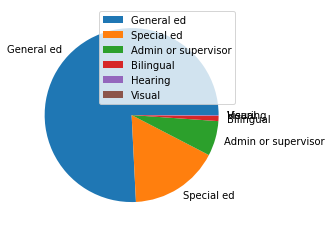

In [ ]:
plt.pie(tyle, labels=tyle.index)
plt.legend()
plt.show()

### phân bó lương theo thể loại giáo viên/nhân viên

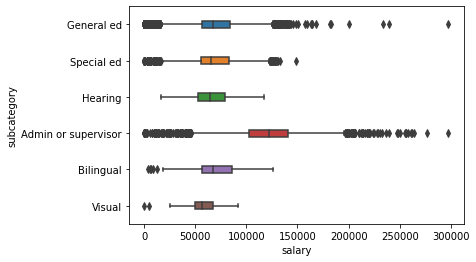

In [ ]:
sns.boxplot(data=df, y='subcategory', x='salary', width=0.2)
# plt.show()

### Mức lương cao nhất của từng thể loại giáo viên / nhân viên

In [ ]:
# Sử dụng groupby
subcategory_max = df.groupby(by='subcategory')['salary'].max()
subcategory_max

subcategory
Admin or supervisor    297625
Bilingual              126467
General ed             296787
Hearing                117060
Special ed             148370
Visual                  91913
Name: salary, dtype: int64

- Mức lương cao nhất cao nhất của từng thể loại giáo viên / nhân viên là : Admin or supervisor
- Mức lương cao nhất thấp nhất của từng thể loại giáo viên / nhân viên là : Visual

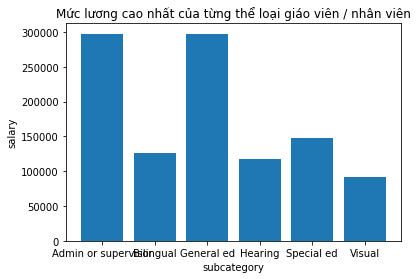

In [ ]:
plt.bar(subcategory_max.index, subcategory_max.values)
plt.xlabel('subcategory')
plt.ylabel('salary')
plt.title('Mức lương cao nhất của từng thể loại giáo viên / nhân viên')

plt.show()

### Mức lương trung bình của từng thể loại giáo viên / nhân viên

In [ ]:
# Sử dụng groupby
subcategory_mean = df.groupby(by='subcategory')['salary'].mean()
subcategory_mean

subcategory
Admin or supervisor    122037.779241
Bilingual               71674.379523
General ed              70985.116098
Hearing                 66642.788732
Special ed              69436.627099
Visual                  55041.727273
Name: salary, dtype: float64

- Mức lương trung bình cao nhất của từng thể loại giáo viên / nhân viên là : Admin or supervisor
- Mức lương trung bình thấp nhất của từng thể loại giáo viên / nhân viên là : Visual

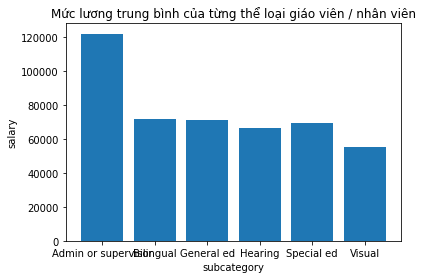

In [ ]:
plt.bar(subcategory_mean.index, subcategory_mean.values)
plt.xlabel('subcategory')
plt.ylabel('salary')
plt.title('Mức lương trung bình của từng thể loại giáo viên / nhân viên')

plt.show()

## lộ trình ảnh hưởng thế nào đến phân bố lương

### Có bao nhiêu lộ trình giáo viên / nhân viên tỉ lệ bao nhiêu

In [ ]:
print('Thống kê số lượng lộ trình giáo viên / nhân viên: ')
ty = df['teaching_route'].value_counts()
print(ty)
print('\n\nTỷ lệ của lộ trình giáo viên / nhân viên: ')
tyle = round((df['teaching_route'].value_counts() / df['teaching_route'].count()) * 100, 2)
print(tyle)

Thống kê số lượng lộ trình giáo viên / nhân viên: 
Traditional    121914
Alternate       16080
X                  50
Name: teaching_route, dtype: int64


Tỷ lệ của lộ trình giáo viên / nhân viên: 
Traditional    88.32
Alternate      11.65
X               0.04
Name: teaching_route, dtype: float64


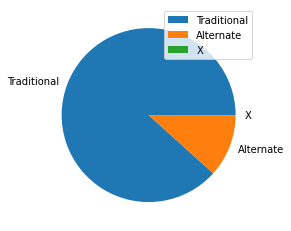

In [ ]:
plt.pie(tyle, labels=tyle.index)
plt.legend()
plt.show()

### phân bó lương theo lộ trình giáo viên/nhân viên



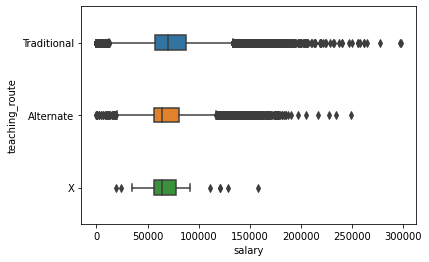

In [ ]:
sns.boxplot(data=df, y='teaching_route', x='salary', width=0.2)
# plt.show()

### Mức lương cao nhất của từng lộ trình giáo viên / nhân viên

In [ ]:
# Sử dụng groupby
teaching_route_max = df.groupby(by='teaching_route')['salary'].max()
teaching_route_max

teaching_route
Alternate      248700
Traditional    297625
X              157500
Name: salary, dtype: int64

- Mức lương cao nhất cao nhất của từng lộ trình giáo viên / nhân viên là : Traditional
- Mức lương cao nhất thấp nhất của từng lộ trình giáo viên / nhân viên là : X

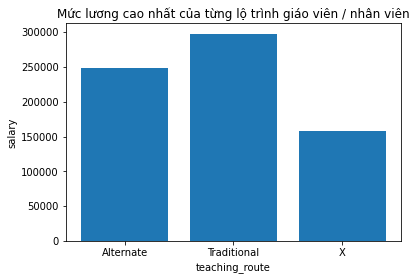

In [ ]:
plt.bar(teaching_route_max.index, teaching_route_max.values)
plt.xlabel('teaching_route')
plt.ylabel('salary')
plt.title('Mức lương cao nhất của từng lộ trình giáo viên / nhân viên')

plt.show()

### Mức lương trung bình của từng lộ trình giáo viên / nhân viên

In [ ]:
# Sử dụng groupby
teaching_route_mean = df.groupby(by='teaching_route')['salary'].mean()
teaching_route_mean

teaching_route
Alternate      70236.690299
Traditional    74542.270035
X              69452.180000
Name: salary, dtype: float64

- Mức lương trung bình cao nhất của từng lộ trình giáo viên / nhân viên là : Traditional
- Mức lương trung bình thấp nhất của từng lộ trình giáo viên / nhân viên là : X

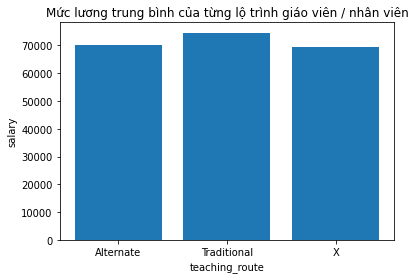

In [ ]:
plt.bar(teaching_route_mean.index, teaching_route_mean.values)
plt.xlabel('teaching_route')
plt.ylabel('salary')
plt.title('Mức lương trung bình của từng lộ trình giáo viên / nhân viên')

plt.show()

## Chứng chỉ ảnh hưởng thế nào đến phân bố lương

In [ ]:
df[['certificate']].value_counts()

certificate         
Standard certificate    122977
Provisional               7038
CEAS                      5152
CE                        2421
Non Citizen                243
Emergency                  181
X                           32
dtype: int64

### Tính trung bình lương giáo viên của mỗi chứng chỉ

In [ ]:
df_certificate = df.groupby(by='certificate')['salary'].mean()
df_certificate

certificate
CE                      67046.870302
CEAS                    54164.040567
Emergency               61287.359116
Non Citizen             67748.292181
Provisional             60448.358198
Standard certificate    75820.831025
X                       63798.718750
Name: salary, dtype: float64

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=df_certificate.index,
    y=df_certificate.values,
))

fig.layout.update(
    autosize=False,
    width=800,
    height=500,
    )

fig.update_layout(title="Biểu đồ phân bố lương trung bình ở mỗi chứng chỉ", xaxis_title="Certificate", yaxis_title="Salary")
fig.update_yaxes(automargin=True)

fig.show()

## Công việc ảnh hưởng thế nào đến phân bố lương

In [ ]:
df[['primary_job']].value_counts()

primary_job                               
Elementary Kindergraten-8 Grade               15758
Elementary School Teacher K-5                 14461
Resource Program In-class                      9579
English Non-elementary                         5074
Math Non-elementary                            5012
                                              ...  
Business English                                  1
Marine Sciences                                   1
Maintenance Mechanics                             1
Non-supervisory Coordinator Social Studies        1
Small Engine Repair(internal Combustion)          1
Length: 339, dtype: int64

In [ ]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['primary_job'], y=df['salary'],mode='markers',
                         marker={'color':'red','size': 9}))

fig.layout.update(
    autosize=False,
    width=2000,
    height=1000,
    )
fig.update_layout(title="Biểu đồ phân bố lương ở mỗi Công việc",
                 xaxis_title="salary",
                 yaxis_title="primary job")
fig.show()

### Top 10 Chức vụ có lương nhiều nhât/thấp nhất?

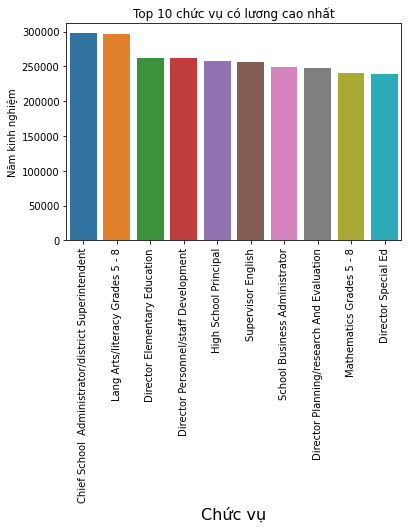

In [ ]:
job_experience_max= df.groupby(by='primary_job')['salary'].agg(['count', 'max']).nlargest(10,'max')
job_experience_max
sns.barplot(x= job_experience_max.index, y=job_experience_max['max'].values)
plt.xticks(rotation=90)
plt.xlabel('Chức vụ', fontsize=16)
plt.ylabel("Năm kinh nghiệm", fontsize=10)
plt.title("Top 10 chức vụ có lương cao nhất")
plt.show()

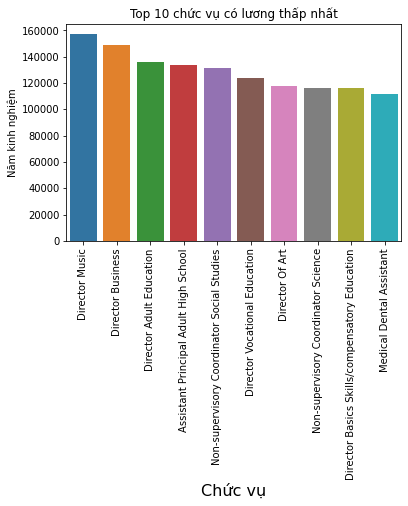

In [ ]:
job_experience_min= df.groupby(by='primary_job')['salary'].agg(['count', 'min']).nlargest(10,'min')
job_experience_min
sns.barplot(x= job_experience_min.index, y=job_experience_min['min'].values)
plt.xticks(rotation=90)
plt.xlabel('Chức vụ', fontsize=16)
plt.ylabel("Năm kinh nghiệm", fontsize=10)
plt.title("Top 10 chức vụ có lương thấp nhất")
plt.show()

### Tính trung bình lương giáo viên của mỗi Công việc

In [ ]:
df_primary_job = df.groupby(by='primary_job')['salary'].mean()
df_primary_job

primary_job
Administrative Assistant To District Superintendent    128519.333333
Adult High School Principal                            137826.600000
Advertising                                             71513.666667
Agricultural Occupations                                72514.184211
Agricultural Technology                                 76378.833333
                                                           ...      
Vocational Arts/dance                                   68948.150000
Vocational Arts/electronic Music                        62606.000000
Vocational School Principal                            134088.035714
Warehousing                                             66770.000000
Welding                                                 80520.250000
Name: salary, Length: 339, dtype: float64

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=df_primary_job.index,
    y=df_primary_job.values,
))

fig.layout.update(
    # autosize=False,
    width=2000,
    height=1000,
    )

fig.update_layout(title="Biểu đồ phân bố lương trung bình ở mỗi Công việc", xaxis_title="Certificate", yaxis_title="Salary")
# fig.update_yaxes(automargin=True)

fig.show()

## Trình độ ảnh hưởng thế nào đến phân bố lương

In [ ]:
df[['highly_qualified']].value_counts()

highly_qualified                                                      
Highly qualified. Passed the Praxis/NTE                                   67113
Doesn't need to be highly qualified                                       28387
Highly qualified. National Board Certified.                               13293
Highly qualified. Has gradate or undergraduate degree in subject area.    12497
Highly qualified, House Matrix                                             8599
Highly qualified. Has 30 credits in content area.                          7785
Not highly qualified                                                        291
Nationally Board Certified                                                   79
dtype: int64

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['highly_qualified'], y=df['salary'],mode='markers',
                         marker={'color':'red','size': 5}))

fig.layout.update(
    autosize=False,
    )
fig.update_layout(title="Biểu đồ phân bố lương của trình độ",
                 xaxis_title="salary",
                 yaxis_title="highly_qualified")
fig.show()

### Tính trung bình lương giáo viên của mỗi Trình độ

In [ ]:
df_highly_qualified = df.groupby(by='highly_qualified')['salary'].mean()
df_highly_qualified

highly_qualified
Doesn't need to be highly qualified                                       85728.813999
Highly qualified, House Matrix                                            82112.868124
Highly qualified. Has 30 credits in content area.                         75567.219525
Highly qualified. Has gradate or undergraduate degree in subject area.    77262.834840
Highly qualified. National Board Certified.                               67951.312947
Highly qualified. Passed the Praxis/NTE                                   68509.432971
Nationally Board Certified                                                79951.544304
Not highly qualified                                                      67496.567010
Name: salary, dtype: float64

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=df_highly_qualified.index,
    y=df_highly_qualified.values,
))

fig.layout.update(
    # autosize=False,
    width=2000,
    height=1000,
    )

fig.update_layout(title="Biểu đồ phân bố lương trung bình ở mỗi Trình độ", xaxis_title="Certificate", yaxis_title="Salary")
# fig.update_yaxes(automargin=True)

fig.show()

## Năm kinh nghiệm

In [ ]:
df_0 = df.loc[df['experience_total']==0, ['experience_total']].count()
print(f'Số lượng giáo viên/nhân viên không có số năm kinh nghiêm: {df_0} ')
n = df['experience_total'].count()
tyle_tip = ((df.loc[df['experience_total'] == 0, ['experience_total']].count()) / n) * 100
print(f'Ty le giáo viên/nhân viên không có số năm kinh nghiêm: {tyle_tip} ')

Số lượng giáo viên/nhân viên không có số năm kinh nghiêm: experience_total    6069
dtype: int64 
Ty le giáo viên/nhân viên không có số năm kinh nghiêm: experience_total    4.396424
dtype: float64 


## Năm kinh nghiệm ảnh hưởng thế nào đến phân bố lương

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['experience_total'], y=df['salary'],mode='markers',
                         marker={'color':'red','size': 5}))

fig.layout.update(
    autosize=False,
    )
fig.update_layout(title="Biểu đồ phân bố lương của năm kinh nghiệm",
                 xaxis_title="experience_total",
                 yaxis_title="salary")
fig.show()

### Năm kinh nghiệm nhiều nhất/thấp nhất?

In [ ]:
df.describe()['experience_total']

count    138044.000000
mean         12.122809
std           8.881681
min           0.000000
25%           5.000000
50%          11.000000
75%          17.000000
max          62.000000
Name: experience_total, dtype: float64

> Vậy số năm kinh nghiệm nhiều nhất là 62 năm, còn ít nhất là chưa có kinh nghiệm

In [ ]:
#danh sách những người có số năm kinh nghiệm cao nhất
df[df['experience_total']==62]

,last_name,first_name,county,district,school,primary_job,salary,certificate,subcategory,teaching_route,highly_qualified,experience_total
56023,Strynar,Marvin A,Hudson,Jersey City,District Office,Elementary School Principal,159000,Standard certificate,Admin or supervisor,Traditional,Highly qualified. National Board Certified.,62.0


In [ ]:
#danh sách những người chưa có kinh nghiệm làm việc
df[df['experience_total']==0]

,last_name,first_name,county,district,school,primary_job,salary,certificate,subcategory,teaching_route,highly_qualified,experience_total
9,Smith,Brittany M,Atlantic,Atlantic City,Sovereign Avenue School,Preschool,48836,CEAS,General ed,Traditional,Doesn't need to be highly qualified,0.0
86,Mancuso,Francesca L,Atlantic,Atlantic City,Sovereign Avenue School,Preschool,43952,CE,General ed,Traditional,Doesn't need to be highly qualified,0.0
117,Dennison,Jeffrey C,Atlantic,Atlantic City,Atlantic City High School,Science Military,102924,Standard certificate,General ed,Traditional,Doesn't need to be highly qualified,0.0
142,Rosenfeld,Randee,Atlantic,Atlantic City,Atlantic City High School,Photography/technical,48836,CEAS,General ed,Traditional,Doesn't need to be highly qualified,0.0
179,Off,Jennifer S,Atlantic,Atlantic City,Atlantic City High School,Math Non-elementary,53270,CEAS,General ed,Traditional,Highly qualified. Passed the Praxis/NTE,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
137939,Sloan,Erin C,Charter,Robert Treat Academy Charter School,Robert Treat Academy Charter School,Lang Arts/literacy Grades 5 - 8,45000,CE,General ed,Alternate,Highly qualified. National Board Certified.,0.0
137968,Worthington,Lauren,Charter,University Heights Charter School,University Heights Charter School,Social Studies/elementary,52000,CEAS,General ed,Traditional,Highly qualified. National Board Certified.,0.0
137969,Allison,Robert,Charter,University Heights Charter School,University Heights Charter School,Elementary School Teacher K-5,54150,Standard certificate,General ed,Traditional,Highly qualified. National Board Certified.,0.0
137993,Scheideler,Courtney,Charter,Maria Varisco Rogers Charter School,Maria Varisco Rogers Charter School,Mathematics Grades 5 - 8,47300,CEAS,General ed,Traditional,Highly qualified. National Board Certified.,0.0


## Năm kinh nghiệm trung bình của công việc

### Top 10 Chức vụ có lương nhiều nhât/thấp nhất?

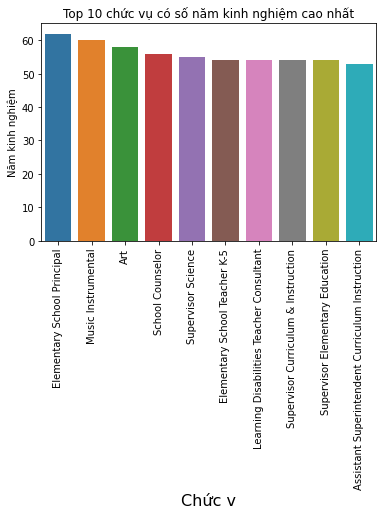

In [ ]:
job_experience_max= df.groupby(by='primary_job')['experience_total'].agg(['count', 'max']).nlargest(10,'max')
job_experience_max
sns.barplot(x= job_experience_max.index, y=job_experience_max['max'].values)
plt.xticks(rotation=90)
plt.xlabel('Chức v', fontsize=16)
plt.ylabel("Năm kinh nghiệm", fontsize=10)
plt.title("Top 10 chức vụ có số năm kinh nghiệm cao nhất")
plt.show()

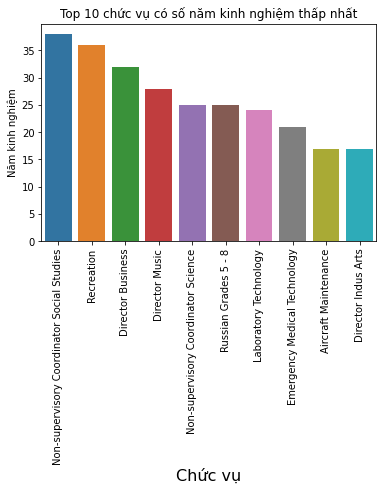

In [ ]:
job_experience_min= df.groupby(by='primary_job')['experience_total'].agg(['count', 'min']).nlargest(10,'min')
job_experience_min
sns.barplot(x= job_experience_min.index, y=job_experience_min['min'].values)
plt.xticks(rotation=90)
plt.xlabel('Chức vụ', fontsize=16)
plt.ylabel("Năm kinh nghiệm", fontsize=10)
plt.title("Top 10 chức vụ có số năm kinh nghiệm thấp nhất")
plt.show()

### Sự tương quan giữa các yếu tố đên mức lương

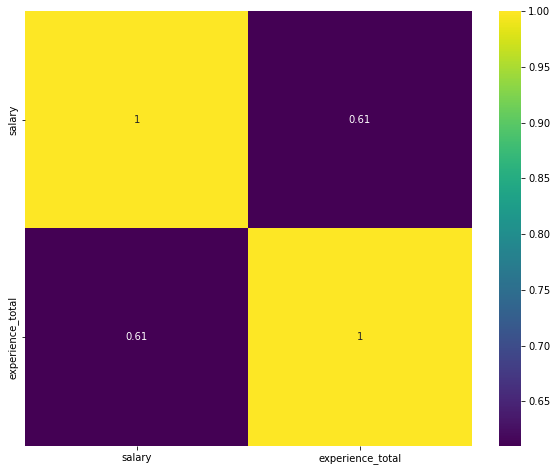

In [ ]:
#plotting heatmap
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot=True, cmap='viridis')

In [ ]:
import pandas as pd
import numpy as np

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from dash import Dash, html, dcc, Input, Output, State

app = Dash(__name__)

df = pd.read_csv('nj_teachers_salaries_2016.csv')
df.drop(columns=['last_name', 'first_name', 'fte'], inplace=True)
df.dropna(inplace=True)
df = df.loc[(df!='X').all(axis=1)]

# -------------------- Select categorical feature -----------------------------
select_category = dcc.Dropdown(options=[{'label': 'Certificate', 'value': 'certificate'},
                                     {'label': 'Subcategory', 'value': 'subcategory'},
                                     {'label': 'Teaching route', 'value': 'teaching_route'},
                                     {'label': 'Hightly qualified', 'value': 'highly_qualified'}],
                            value=None, 
                            placeholder='Select',
                            id='select-category',
                            style={'font-size': '14px', 'flex': '1'})

category_container = html.Div(children=['Category: ',
                                        select_category],
                              id='category-container',
                              style={
                                  'display': 'flex',
                                  'font-size': '12px',
                                  'align-items': 'center',
                                  'width': '100%'
                              })

# --------------------- Select county ------------------------------------------------
county = df['county'].unique()
select_county = dcc.Dropdown(options=county,
                             value=county[0],
                             clearable=False,
                             id='select-county',
                             style={'flex': '1', 'font-size': '16px'})

county_container = html.Div(children=['County: ', select_county],
                            id='county-container',
                            style={
                                'display': 'flex', 
                                'font-size': '12px', 
                                'align-items': 'center'
                            })

# ------------------------ Select district -----------------------------------------
check_type = True
select_check_type = dcc.Dropdown(options=[{'label': 'select one', 'value': True}, 
                                          {'label': 'select many', 'value': False}],
                                value=check_type,
                                clearable=False,
                                id='select-check-type',
                                style={'flex': '1'})

check_all = dcc.Checklist(options=['All'],
                          value=[],
                          id='check-all',
                          style={})

check_container = html.Div(children=['District: ',
                                     select_check_type,
                                     check_all], 
                           id='check-container',
                           style={
                               'font-size': '12px',
                               'display': 'flex',
                               'width': '160px',
                               'align-items': 'center'
                           })

def select_district(options, type_, id_, style, labelStyle):
    if type_:
        return dcc.RadioItems(options=options, 
                              value=[], 
                              id=id_, 
                              style=style, 
                              labelStyle=labelStyle)
    
    return dcc.Checklist(options=options, 
                         value=[], 
                         id=id_, 
                         style=style, 
                         labelStyle=labelStyle)

options = df.loc[df['county']==county[0], 'district'].unique()
id_ = 'select-district'

select_district_style = {
    'display': 'flex',
    'flex-direction': 'column',
    'width': '160px',
    'height': '500px',
    'overflow-y': 'scroll',
    'margin-right': '0'
}

select_district_labelStyle = {
    'width': '100%',
    'font-size': '14px',
    'padding': '4px 0'
}

district_container = html.Div(children=[check_container,
                                        select_district(options=options, 
                                                        type_=check_type,
                                                        id_=id_,
                                                        style=select_district_style,
                                                        labelStyle=select_district_labelStyle)],
                              id='district-container',
                              style={'margin-top': '6px'})

# ------------------------------ Select graph theme -------------------------------------------
select_graph_theme = dcc.RadioItems(options=[{'label': 'light', 'value': 'seaborn'}, 
                                             {'label': 'dark', 'value': 'plotly_dark'}],
                                  value='seaborn',
                                  id='select-graph-theme',
                                  style={'flex': '1', 'font-size': '14px'})

graph_theme_container = html.Div(children=['Mode: ', select_graph_theme],
                                 id='graph-theme-container',
                                 style={
                                        'margin-top': '6px',
                                        'display': 'flex', 
                                        'align-items': 'center',
                                        'font-size': '12px',
                                        'width': '160px'})


# ------------------------------ Filter container ---------------------------------------------
filters_container = html.Div(children=[category_container,
                                       county_container,
                                       district_container,
                                       graph_theme_container], 
                             style={
                                 'position': 'fixed',
                                 'top': '0',
                                 'left': '0',
                                 'width': '160px'
                             })

# ---------------------------------- Graph -----------------------------------------------------
graph = dcc.Graph(id='graph', style={'height': '100%'})
graph_title = html.H2(children=['Teacher\'s salary in New Jersey in 2016'], style={'margin': '0'})

graph_container = html.Div(children=[graph_title,
                                     graph],
                           id='graph-container',
                           style={
                               'margin-left': '154px', 
                               'width': '100%', 
                               'height': '1000px'})

# Define layout of Dashboard -------------------------------------------------------------------
app.layout = html.Div(children=[html.Div(children=[filters_container]),
                                 graph_container],
                      style={'display': 'flex'})

# processing fitler ------------------------------------------------
@app.callback(Output('select-district', 'options'),
              Input('select-county', 'value'))
def update_options(value):
    return df.loc[df['county']==value, 'district'].unique()

@app.callback(Output('check-all', 'options'), 
              Output('check-all', 'value'), 
              Input('select-check-type', 'value'))
def disable_all_check(value):
    return [{'label': 'All', 'value': 'All', 'disabled': value}], []

@app.callback(Output('district-container', 'children'), 
              Input('select-check-type', 'value'),
              Input('select-district', 'options'),
              State('select-district', 'id'),
              State('select-district', 'style'),
              State('select-district', 'labelStyle'),
              State('district-container', 'children'))
def change_select_district(value, options, id_, style, labelStyle, children):
    children[-1] = select_district(options=options, 
                                  type_=value, 
                                  id_=id_, 
                                  style=style, 
                                  labelStyle=labelStyle)
    return children

@app.callback(Output('select-district', 'value'),
              Input('check-all', 'value'),
              State('select-district', 'options'))
def get_check_values(value, options):
    return options if value else []

# processing graph --------------------------------------------------
@app.callback(Output('graph', 'figure'), 
              Input('select-district', 'value'),
              Input('select-graph-theme', 'value'),
              Input('select-category', 'value'))
def update_graph(districts, template, category):
    if type(districts) != type([]):
        districts = [districts]
    dff = df.loc[df['district'].isin(districts)]
    check = dff.values.tolist() != []

    fig = make_subplots(rows=3, cols=3, specs=[[{'rowspan': 2, 'colspan': 2}, None, {}], 
                                               [None, None, {}], 
                                               [{'type': 'pie'}, {'colspan': 2}, None]])
    
    fig.add_traces(data=px.scatter(data_frame=dff, 
                                   x='experience_total', 
                                   y='salary', 
                                   color=category, 
                                   trendline='ols').update_traces(showlegend=False).data if check else None,
                   rows=1, cols=1)
    
    fig['layout']['xaxis'].update(title='experience_total')
    fig['layout']['yaxis'].update(title='salary')
    
    fig.add_traces(
        data=px.histogram(data_frame=dff, 
                          x='salary', 
                          color=category, 
                          barmode='overlay').update_traces(bingroup='a', showlegend=False).data if check else None,
        rows=1, cols=3)
    fig['layout']['xaxis2'].update(title='salary')
    
    fig.add_traces(
        data=px.histogram(data_frame=dff.copy(), 
                          x='experience_total', 
                          color=category, 
                          barmode='overlay').update_traces(bingroup='b', showlegend=False).data if check else None,
        rows=2, cols=3)
    fig['layout']['xaxis3'].update(title='experience_total')
    
    
    if category:
        fig.add_traces(data=px.pie(data_frame=dff,
                                   names=category,
                                   hole=0.2).update_traces(showlegend=False).data if check else None, 
                       rows=3, cols=1)
    
    fig.add_traces(
        data=px.box(data_frame=dff, 
                    x=category, 
                    y='salary', 
                    color=category).data if check else None,
        rows=3, cols=2)
    fig['layout']['xaxis4'].update(title=category, showticklabels=False)
    fig['layout']['yaxis4'].update(title='salary')
        
    legend={
        'title': category,
        'xanchor': 'left',
        'x': 0,
        'yanchor': 'bottom',
        'y': 1,
        'orientation': 'h'
    }
    fig.update_layout(template=template, legend=legend)
    return fig


# ------------------------------- RUN APP --------------------------------------------
app.run_server()